## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook.

In [1]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
import xgboost as xgb

sns.set()

In [3]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [4]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [5]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [2]:
df = pd.read_csv("../../Datasets/Datos_durante_pandemia/data_durante_vol_in.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,VIX,EMV-ID,EPU
0,2020-01-01,1.289946,12.548403,1.89,186.06
1,2020-01-02,0.735046,12.470000,2.84,139.13
2,2020-01-03,0.591834,14.020000,1.33,108.10
3,2020-01-04,1.367154,14.646666,0.00,212.82
4,2020-01-05,1.505321,14.311970,0.86,173.76
...,...,...,...,...,...
913,2022-07-02,0.778572,25.922916,11.11,130.95
914,2022-07-03,0.819483,26.641413,23.06,135.95
915,2022-07-04,0.843804,27.530000,15.98,309.83
916,2022-07-05,0.850985,27.540000,18.90,116.59


---

## Desarrollo del modelo

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    df_label=df_label[lag:]
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    
   
    #make model
    model=xgb.XGBRegressor(n_estimators=estimators
                        ,early_stopping_rounds=80)
    #fit the model with the train data
    
    history=model.fit(df_train,df_train_y_normalize,
          eval_set=[(df_train,df_train_y_normalize),(df_test,df_test_y_normalize)])
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)
    
    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeXGBoost":["train"]*len(trainPredict.flatten()),"XGBoost" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeXGBoost":["test"]*len(testPredict.flatten()),"XGBoost":testPredict.flatten()}]
   
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados 

[0]	validation_0-rmse:0.98857	validation_1-rmse:0.96214
[1]	validation_0-rmse:0.88184	validation_1-rmse:0.94065
[2]	validation_0-rmse:0.77410	validation_1-rmse:0.94119
[3]	validation_0-rmse:0.71920	validation_1-rmse:0.95848
[4]	validation_0-rmse:0.67925	validation_1-rmse:0.95863
[5]	validation_0-rmse:0.63258	validation_1-rmse:0.96938
[6]	validation_0-rmse:0.59233	validation_1-rmse:0.98719
[7]	validation_0-rmse:0.56961	validation_1-rmse:0.99448
[8]	validation_0-rmse:0.55510	validation_1-rmse:0.99633
[9]	validation_0-rmse:0.53797	validation_1-rmse:0.99388
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.2149844288893545
MAE is : 0.8752933853077363
RMSE is : 1.102263321030576
MAPE is : 48.44160363445587
Evaluation metric results:
MSE is : 1.378629466175599
MAE is : 0.9409981173443018
RMSE is : 1.1741505296066594
MAPE is : 50.77633091916668
[0]	validation_0-rmse:0.98857	validation_1-rmse:0.96214
[1]	validation_0-rmse:0.88184	validation_1-rmse:0.94065
[2]	val

[23]	validation_0-rmse:0.32312	validation_1-rmse:1.02531
[24]	validation_0-rmse:0.30780	validation_1-rmse:1.02494
[25]	validation_0-rmse:0.29669	validation_1-rmse:1.02468
[26]	validation_0-rmse:0.29097	validation_1-rmse:1.02748
[27]	validation_0-rmse:0.28463	validation_1-rmse:1.02861
[28]	validation_0-rmse:0.27973	validation_1-rmse:1.02896
[29]	validation_0-rmse:0.26868	validation_1-rmse:1.03086
[30]	validation_0-rmse:0.26575	validation_1-rmse:1.03137
[31]	validation_0-rmse:0.25301	validation_1-rmse:1.03333
[32]	validation_0-rmse:0.24359	validation_1-rmse:1.03427
[33]	validation_0-rmse:0.23731	validation_1-rmse:1.03304
[34]	validation_0-rmse:0.23179	validation_1-rmse:1.03322
[35]	validation_0-rmse:0.21942	validation_1-rmse:1.02900
[36]	validation_0-rmse:0.20843	validation_1-rmse:1.03197
[37]	validation_0-rmse:0.20458	validation_1-rmse:1.03164
[38]	validation_0-rmse:0.19482	validation_1-rmse:1.03468
[39]	validation_0-rmse:0.18384	validation_1-rmse:1.03755
[40]	validation_0-rmse:0.17009	

[46]	validation_0-rmse:0.13354	validation_1-rmse:1.03996
[47]	validation_0-rmse:0.12620	validation_1-rmse:1.04191
[48]	validation_0-rmse:0.12047	validation_1-rmse:1.04262
[49]	validation_0-rmse:0.11361	validation_1-rmse:1.04238
[50]	validation_0-rmse:0.10989	validation_1-rmse:1.04267
[51]	validation_0-rmse:0.10810	validation_1-rmse:1.04224
[52]	validation_0-rmse:0.10200	validation_1-rmse:1.04303
[53]	validation_0-rmse:0.09655	validation_1-rmse:1.04299
[54]	validation_0-rmse:0.09347	validation_1-rmse:1.04510
[55]	validation_0-rmse:0.08922	validation_1-rmse:1.04469
[56]	validation_0-rmse:0.08761	validation_1-rmse:1.04447
[57]	validation_0-rmse:0.08327	validation_1-rmse:1.04373
[58]	validation_0-rmse:0.07924	validation_1-rmse:1.04442
[59]	validation_0-rmse:0.07680	validation_1-rmse:1.04344
[60]	validation_0-rmse:0.07550	validation_1-rmse:1.04341
[61]	validation_0-rmse:0.07210	validation_1-rmse:1.04411
[62]	validation_0-rmse:0.06933	validation_1-rmse:1.04321
[63]	validation_0-rmse:0.06772	

[29]	validation_0-rmse:0.26868	validation_1-rmse:1.03086
[30]	validation_0-rmse:0.26575	validation_1-rmse:1.03137
[31]	validation_0-rmse:0.25301	validation_1-rmse:1.03333
[32]	validation_0-rmse:0.24359	validation_1-rmse:1.03427
[33]	validation_0-rmse:0.23731	validation_1-rmse:1.03304
[34]	validation_0-rmse:0.23179	validation_1-rmse:1.03322
[35]	validation_0-rmse:0.21942	validation_1-rmse:1.02900
[36]	validation_0-rmse:0.20843	validation_1-rmse:1.03197
[37]	validation_0-rmse:0.20458	validation_1-rmse:1.03164
[38]	validation_0-rmse:0.19482	validation_1-rmse:1.03468
[39]	validation_0-rmse:0.18384	validation_1-rmse:1.03755
[40]	validation_0-rmse:0.17009	validation_1-rmse:1.03636
[41]	validation_0-rmse:0.16507	validation_1-rmse:1.03629
[42]	validation_0-rmse:0.15724	validation_1-rmse:1.03609
[43]	validation_0-rmse:0.14806	validation_1-rmse:1.03875
[44]	validation_0-rmse:0.14564	validation_1-rmse:1.03876
[45]	validation_0-rmse:0.13888	validation_1-rmse:1.03849
[46]	validation_0-rmse:0.13354	

[0]	validation_0-rmse:0.98857	validation_1-rmse:0.96214
[1]	validation_0-rmse:0.88184	validation_1-rmse:0.94065
[2]	validation_0-rmse:0.77410	validation_1-rmse:0.94119
[3]	validation_0-rmse:0.71920	validation_1-rmse:0.95848
[4]	validation_0-rmse:0.67925	validation_1-rmse:0.95863
[5]	validation_0-rmse:0.63258	validation_1-rmse:0.96938
[6]	validation_0-rmse:0.59233	validation_1-rmse:0.98719
[7]	validation_0-rmse:0.56961	validation_1-rmse:0.99448
[8]	validation_0-rmse:0.55510	validation_1-rmse:0.99633
[9]	validation_0-rmse:0.53797	validation_1-rmse:0.99388
[10]	validation_0-rmse:0.51088	validation_1-rmse:0.99515
[11]	validation_0-rmse:0.48514	validation_1-rmse:1.00295
[12]	validation_0-rmse:0.45989	validation_1-rmse:1.00030
[13]	validation_0-rmse:0.44574	validation_1-rmse:1.00247
[14]	validation_0-rmse:0.43772	validation_1-rmse:1.00051
[15]	validation_0-rmse:0.43170	validation_1-rmse:1.00190
[16]	validation_0-rmse:0.41729	validation_1-rmse:1.00470
[17]	validation_0-rmse:0.40120	validation

<ipython-input-3-f7487097fa4e>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


[0]	validation_0-rmse:0.98857	validation_1-rmse:0.96214
[1]	validation_0-rmse:0.88184	validation_1-rmse:0.94065
[2]	validation_0-rmse:0.77410	validation_1-rmse:0.94119
[3]	validation_0-rmse:0.71920	validation_1-rmse:0.95848
[4]	validation_0-rmse:0.67925	validation_1-rmse:0.95863
[5]	validation_0-rmse:0.63258	validation_1-rmse:0.96938
[6]	validation_0-rmse:0.59233	validation_1-rmse:0.98719
[7]	validation_0-rmse:0.56961	validation_1-rmse:0.99448
[8]	validation_0-rmse:0.55510	validation_1-rmse:0.99633
[9]	validation_0-rmse:0.53797	validation_1-rmse:0.99388
[10]	validation_0-rmse:0.51088	validation_1-rmse:0.99515
[11]	validation_0-rmse:0.48514	validation_1-rmse:1.00295
[12]	validation_0-rmse:0.45989	validation_1-rmse:1.00030
[13]	validation_0-rmse:0.44574	validation_1-rmse:1.00247
[14]	validation_0-rmse:0.43772	validation_1-rmse:1.00051
[15]	validation_0-rmse:0.43170	validation_1-rmse:1.00190
[16]	validation_0-rmse:0.41729	validation_1-rmse:1.00470
[17]	validation_0-rmse:0.40120	validation

[16]	validation_0-rmse:0.36877	validation_1-rmse:1.05542
[17]	validation_0-rmse:0.34035	validation_1-rmse:1.06131
[18]	validation_0-rmse:0.31721	validation_1-rmse:1.05352
[19]	validation_0-rmse:0.31098	validation_1-rmse:1.05354
[20]	validation_0-rmse:0.29512	validation_1-rmse:1.05225
[21]	validation_0-rmse:0.28683	validation_1-rmse:1.05249
[22]	validation_0-rmse:0.25762	validation_1-rmse:1.05070
[23]	validation_0-rmse:0.24345	validation_1-rmse:1.05146
[24]	validation_0-rmse:0.23349	validation_1-rmse:1.05166
[25]	validation_0-rmse:0.22668	validation_1-rmse:1.05277
[26]	validation_0-rmse:0.21920	validation_1-rmse:1.05312
[27]	validation_0-rmse:0.20342	validation_1-rmse:1.05190
[28]	validation_0-rmse:0.19939	validation_1-rmse:1.05205
[29]	validation_0-rmse:0.19452	validation_1-rmse:1.05350
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.2008246740118853
MAE is : 0.8824865808254219
RMSE is : 1.0958214608283072
MAPE is : 48.90628237496274
Evaluation metric r

[24]	validation_0-rmse:0.23349	validation_1-rmse:1.05166
[25]	validation_0-rmse:0.22668	validation_1-rmse:1.05277
[26]	validation_0-rmse:0.21920	validation_1-rmse:1.05312
[27]	validation_0-rmse:0.20342	validation_1-rmse:1.05190
[28]	validation_0-rmse:0.19939	validation_1-rmse:1.05205
[29]	validation_0-rmse:0.19452	validation_1-rmse:1.05350
[30]	validation_0-rmse:0.17989	validation_1-rmse:1.05545
[31]	validation_0-rmse:0.16963	validation_1-rmse:1.05461
[32]	validation_0-rmse:0.16482	validation_1-rmse:1.05218
[33]	validation_0-rmse:0.16242	validation_1-rmse:1.05359
[34]	validation_0-rmse:0.15089	validation_1-rmse:1.05105
[35]	validation_0-rmse:0.14086	validation_1-rmse:1.05257
[36]	validation_0-rmse:0.13266	validation_1-rmse:1.05312
[37]	validation_0-rmse:0.12850	validation_1-rmse:1.05318
[38]	validation_0-rmse:0.11958	validation_1-rmse:1.05514
[39]	validation_0-rmse:0.11694	validation_1-rmse:1.05533
[40]	validation_0-rmse:0.11440	validation_1-rmse:1.05486
[41]	validation_0-rmse:0.11228	

[27]	validation_0-rmse:0.20342	validation_1-rmse:1.05190
[28]	validation_0-rmse:0.19939	validation_1-rmse:1.05205
[29]	validation_0-rmse:0.19452	validation_1-rmse:1.05350
[30]	validation_0-rmse:0.17989	validation_1-rmse:1.05545
[31]	validation_0-rmse:0.16963	validation_1-rmse:1.05461
[32]	validation_0-rmse:0.16482	validation_1-rmse:1.05218
[33]	validation_0-rmse:0.16242	validation_1-rmse:1.05359
[34]	validation_0-rmse:0.15089	validation_1-rmse:1.05105
[35]	validation_0-rmse:0.14086	validation_1-rmse:1.05257
[36]	validation_0-rmse:0.13266	validation_1-rmse:1.05312
[37]	validation_0-rmse:0.12850	validation_1-rmse:1.05318
[38]	validation_0-rmse:0.11958	validation_1-rmse:1.05514
[39]	validation_0-rmse:0.11694	validation_1-rmse:1.05533
[40]	validation_0-rmse:0.11440	validation_1-rmse:1.05486
[41]	validation_0-rmse:0.11228	validation_1-rmse:1.05492
[42]	validation_0-rmse:0.10546	validation_1-rmse:1.05352
[43]	validation_0-rmse:0.09812	validation_1-rmse:1.05322
[44]	validation_0-rmse:0.09461	

RMSE is : 1.2122225678572767
MAPE is : 50.79466879088332
[0]	validation_0-rmse:0.98913	validation_1-rmse:0.97793
[1]	validation_0-rmse:0.87550	validation_1-rmse:0.97115
[2]	validation_0-rmse:0.79059	validation_1-rmse:0.97419
[3]	validation_0-rmse:0.72140	validation_1-rmse:0.99527
[4]	validation_0-rmse:0.65383	validation_1-rmse:1.00334
[5]	validation_0-rmse:0.62375	validation_1-rmse:1.00816
[6]	validation_0-rmse:0.57657	validation_1-rmse:1.02050
[7]	validation_0-rmse:0.55733	validation_1-rmse:1.02858
[8]	validation_0-rmse:0.52120	validation_1-rmse:1.04269
[9]	validation_0-rmse:0.50750	validation_1-rmse:1.04573
[10]	validation_0-rmse:0.47536	validation_1-rmse:1.04432
[11]	validation_0-rmse:0.44783	validation_1-rmse:1.04585
[12]	validation_0-rmse:0.43834	validation_1-rmse:1.04681
[13]	validation_0-rmse:0.42423	validation_1-rmse:1.04492
[14]	validation_0-rmse:0.41318	validation_1-rmse:1.04452
[15]	validation_0-rmse:0.39782	validation_1-rmse:1.05193
[16]	validation_0-rmse:0.36877	validation

[57]	validation_0-rmse:0.05524	validation_1-rmse:1.05218
[58]	validation_0-rmse:0.05400	validation_1-rmse:1.05194
[59]	validation_0-rmse:0.05145	validation_1-rmse:1.05179
[60]	validation_0-rmse:0.04997	validation_1-rmse:1.05157
[61]	validation_0-rmse:0.04823	validation_1-rmse:1.05227
[62]	validation_0-rmse:0.04386	validation_1-rmse:1.05257
[63]	validation_0-rmse:0.04260	validation_1-rmse:1.05248
[64]	validation_0-rmse:0.04098	validation_1-rmse:1.05224
[65]	validation_0-rmse:0.03882	validation_1-rmse:1.05156
[66]	validation_0-rmse:0.03797	validation_1-rmse:1.05163
[67]	validation_0-rmse:0.03676	validation_1-rmse:1.05185
[68]	validation_0-rmse:0.03584	validation_1-rmse:1.05189
[69]	validation_0-rmse:0.03381	validation_1-rmse:1.05156
[70]	validation_0-rmse:0.03260	validation_1-rmse:1.05159
[71]	validation_0-rmse:0.03153	validation_1-rmse:1.05170
[72]	validation_0-rmse:0.03086	validation_1-rmse:1.05165
[73]	validation_0-rmse:0.02892	validation_1-rmse:1.05143
[74]	validation_0-rmse:0.02826	

[12]	validation_0-rmse:0.37607	validation_1-rmse:1.05269
[13]	validation_0-rmse:0.36628	validation_1-rmse:1.05303
[14]	validation_0-rmse:0.33844	validation_1-rmse:1.04897
[15]	validation_0-rmse:0.30890	validation_1-rmse:1.05145
[16]	validation_0-rmse:0.28736	validation_1-rmse:1.05151
[17]	validation_0-rmse:0.26003	validation_1-rmse:1.05381
[18]	validation_0-rmse:0.23224	validation_1-rmse:1.05293
[19]	validation_0-rmse:0.22825	validation_1-rmse:1.05292
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.1604687552345319
MAE is : 0.8673934530987858
RMSE is : 1.0772505536014043
MAPE is : 48.08920801641011
Evaluation metric results:
MSE is : 1.427352083246673
MAE is : 0.9387042910016525
RMSE is : 1.1947184116965273
MAPE is : 50.45863729055191
[0]	validation_0-rmse:0.98658	validation_1-rmse:0.96445
[1]	validation_0-rmse:0.86107	validation_1-rmse:0.95713
[2]	validation_0-rmse:0.78921	validation_1-rmse:0.96770
[3]	validation_0-rmse:0.71477	validation_1-rmse:0.9856

len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.1604687552345319
MAE is : 0.8673934530987858
RMSE is : 1.0772505536014043
MAPE is : 48.08920801641011
Evaluation metric results:
MSE is : 1.427352083246673
MAE is : 0.9387042910016525
RMSE is : 1.1947184116965273
MAPE is : 50.45863729055191
[0]	validation_0-rmse:0.98658	validation_1-rmse:0.96445
[1]	validation_0-rmse:0.86107	validation_1-rmse:0.95713
[2]	validation_0-rmse:0.78921	validation_1-rmse:0.96770
[3]	validation_0-rmse:0.71477	validation_1-rmse:0.98564
[4]	validation_0-rmse:0.65911	validation_1-rmse:0.99794
[5]	validation_0-rmse:0.59503	validation_1-rmse:1.01457
[6]	validation_0-rmse:0.55828	validation_1-rmse:1.03270
[7]	validation_0-rmse:0.52964	validation_1-rmse:1.03056
[8]	validation_0-rmse:0.49230	validation_1-rmse:1.03745
[9]	validation_0-rmse:0.45238	validation_1-rmse:1.04962
[10]	validation_0-rmse:0.42298	validation_1-rmse:1.03927
[11]	validation_0-rmse:0.39259	validation_1-rmse:1.04517
[12]

[0]	validation_0-rmse:0.98658	validation_1-rmse:0.96445
[1]	validation_0-rmse:0.86107	validation_1-rmse:0.95713
[2]	validation_0-rmse:0.78921	validation_1-rmse:0.96770
[3]	validation_0-rmse:0.71477	validation_1-rmse:0.98564
[4]	validation_0-rmse:0.65911	validation_1-rmse:0.99794
[5]	validation_0-rmse:0.59503	validation_1-rmse:1.01457
[6]	validation_0-rmse:0.55828	validation_1-rmse:1.03270
[7]	validation_0-rmse:0.52964	validation_1-rmse:1.03056
[8]	validation_0-rmse:0.49230	validation_1-rmse:1.03745
[9]	validation_0-rmse:0.45238	validation_1-rmse:1.04962
[10]	validation_0-rmse:0.42298	validation_1-rmse:1.03927
[11]	validation_0-rmse:0.39259	validation_1-rmse:1.04517
[12]	validation_0-rmse:0.37607	validation_1-rmse:1.05269
[13]	validation_0-rmse:0.36628	validation_1-rmse:1.05303
[14]	validation_0-rmse:0.33844	validation_1-rmse:1.04897
[15]	validation_0-rmse:0.30890	validation_1-rmse:1.05145
[16]	validation_0-rmse:0.28736	validation_1-rmse:1.05151
[17]	validation_0-rmse:0.26003	validation

[59]	validation_0-rmse:0.03055	validation_1-rmse:1.06870
[60]	validation_0-rmse:0.03006	validation_1-rmse:1.06888
[61]	validation_0-rmse:0.02716	validation_1-rmse:1.06860
[62]	validation_0-rmse:0.02608	validation_1-rmse:1.06858
[63]	validation_0-rmse:0.02397	validation_1-rmse:1.06873
[64]	validation_0-rmse:0.02276	validation_1-rmse:1.06876
[65]	validation_0-rmse:0.02177	validation_1-rmse:1.06882
[66]	validation_0-rmse:0.02058	validation_1-rmse:1.06877
[67]	validation_0-rmse:0.01875	validation_1-rmse:1.06873
[68]	validation_0-rmse:0.01793	validation_1-rmse:1.06895
[69]	validation_0-rmse:0.01756	validation_1-rmse:1.06903
[70]	validation_0-rmse:0.01675	validation_1-rmse:1.06923
[71]	validation_0-rmse:0.01560	validation_1-rmse:1.06942
[72]	validation_0-rmse:0.01520	validation_1-rmse:1.06950
[73]	validation_0-rmse:0.01444	validation_1-rmse:1.06946
[74]	validation_0-rmse:0.01380	validation_1-rmse:1.06969
[75]	validation_0-rmse:0.01341	validation_1-rmse:1.06984
[76]	validation_0-rmse:0.01251	

[30]	validation_0-rmse:0.13512	validation_1-rmse:1.06571
[31]	validation_0-rmse:0.13216	validation_1-rmse:1.06513
[32]	validation_0-rmse:0.12088	validation_1-rmse:1.06565
[33]	validation_0-rmse:0.11196	validation_1-rmse:1.06749
[34]	validation_0-rmse:0.10694	validation_1-rmse:1.06751
[35]	validation_0-rmse:0.10380	validation_1-rmse:1.06816
[36]	validation_0-rmse:0.09661	validation_1-rmse:1.06857
[37]	validation_0-rmse:0.09368	validation_1-rmse:1.06852
[38]	validation_0-rmse:0.09107	validation_1-rmse:1.06864
[39]	validation_0-rmse:0.08678	validation_1-rmse:1.06820
[40]	validation_0-rmse:0.07961	validation_1-rmse:1.06822
[41]	validation_0-rmse:0.07256	validation_1-rmse:1.06877
[42]	validation_0-rmse:0.06867	validation_1-rmse:1.06847
[43]	validation_0-rmse:0.06629	validation_1-rmse:1.06820
[44]	validation_0-rmse:0.06379	validation_1-rmse:1.06834
[45]	validation_0-rmse:0.06124	validation_1-rmse:1.06883
[46]	validation_0-rmse:0.05863	validation_1-rmse:1.06893
[47]	validation_0-rmse:0.05335	

[0]	validation_0-rmse:0.98888	validation_1-rmse:0.96862
[1]	validation_0-rmse:0.85890	validation_1-rmse:0.95787
[2]	validation_0-rmse:0.74567	validation_1-rmse:0.95903
[3]	validation_0-rmse:0.68450	validation_1-rmse:0.96721
[4]	validation_0-rmse:0.64866	validation_1-rmse:0.97785
[5]	validation_0-rmse:0.59420	validation_1-rmse:0.98624
[6]	validation_0-rmse:0.57841	validation_1-rmse:0.99197
[7]	validation_0-rmse:0.54431	validation_1-rmse:0.99655
[8]	validation_0-rmse:0.49078	validation_1-rmse:1.00170
[9]	validation_0-rmse:0.47196	validation_1-rmse:1.00274
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.1555947477818527
MAE is : 0.8718034537139633
RMSE is : 1.0749859291087733
MAPE is : 48.32156433249324
Evaluation metric results:
MSE is : 1.4295796847623963
MAE is : 0.9528450083083769
RMSE is : 1.195650318764812
MAPE is : 51.35838799746768
[0]	validation_0-rmse:0.98888	validation_1-rmse:0.96862
[1]	validation_0-rmse:0.85890	validation_1-rmse:0.95787
[2]	va

[23]	validation_0-rmse:0.16900	validation_1-rmse:1.03124
[24]	validation_0-rmse:0.15820	validation_1-rmse:1.03194
[25]	validation_0-rmse:0.14418	validation_1-rmse:1.03492
[26]	validation_0-rmse:0.13304	validation_1-rmse:1.03454
[27]	validation_0-rmse:0.12895	validation_1-rmse:1.03571
[28]	validation_0-rmse:0.12551	validation_1-rmse:1.03583
[29]	validation_0-rmse:0.12169	validation_1-rmse:1.03672
[30]	validation_0-rmse:0.11279	validation_1-rmse:1.03646
[31]	validation_0-rmse:0.10994	validation_1-rmse:1.03686
[32]	validation_0-rmse:0.10357	validation_1-rmse:1.03837
[33]	validation_0-rmse:0.09931	validation_1-rmse:1.03813
[34]	validation_0-rmse:0.09643	validation_1-rmse:1.03796
[35]	validation_0-rmse:0.09462	validation_1-rmse:1.03802
[36]	validation_0-rmse:0.09118	validation_1-rmse:1.03824
[37]	validation_0-rmse:0.08537	validation_1-rmse:1.03752
[38]	validation_0-rmse:0.08117	validation_1-rmse:1.03864
[39]	validation_0-rmse:0.07648	validation_1-rmse:1.03864
[40]	validation_0-rmse:0.07523	

[46]	validation_0-rmse:0.05143	validation_1-rmse:1.03878
[47]	validation_0-rmse:0.04933	validation_1-rmse:1.03887
[48]	validation_0-rmse:0.04770	validation_1-rmse:1.03897
[49]	validation_0-rmse:0.04524	validation_1-rmse:1.03895
[50]	validation_0-rmse:0.04283	validation_1-rmse:1.03877
[51]	validation_0-rmse:0.04011	validation_1-rmse:1.03835
[52]	validation_0-rmse:0.03729	validation_1-rmse:1.03862
[53]	validation_0-rmse:0.03486	validation_1-rmse:1.03881
[54]	validation_0-rmse:0.03400	validation_1-rmse:1.03904
[55]	validation_0-rmse:0.03256	validation_1-rmse:1.03837
[56]	validation_0-rmse:0.03180	validation_1-rmse:1.03812
[57]	validation_0-rmse:0.03010	validation_1-rmse:1.03797
[58]	validation_0-rmse:0.02803	validation_1-rmse:1.03839
[59]	validation_0-rmse:0.02709	validation_1-rmse:1.03882
[60]	validation_0-rmse:0.02496	validation_1-rmse:1.03917
[61]	validation_0-rmse:0.02413	validation_1-rmse:1.03912
[62]	validation_0-rmse:0.02225	validation_1-rmse:1.03930
[63]	validation_0-rmse:0.02048	

[29]	validation_0-rmse:0.12169	validation_1-rmse:1.03672
[30]	validation_0-rmse:0.11279	validation_1-rmse:1.03646
[31]	validation_0-rmse:0.10994	validation_1-rmse:1.03686
[32]	validation_0-rmse:0.10357	validation_1-rmse:1.03837
[33]	validation_0-rmse:0.09931	validation_1-rmse:1.03813
[34]	validation_0-rmse:0.09643	validation_1-rmse:1.03796
[35]	validation_0-rmse:0.09462	validation_1-rmse:1.03802
[36]	validation_0-rmse:0.09118	validation_1-rmse:1.03824
[37]	validation_0-rmse:0.08537	validation_1-rmse:1.03752
[38]	validation_0-rmse:0.08117	validation_1-rmse:1.03864
[39]	validation_0-rmse:0.07648	validation_1-rmse:1.03864
[40]	validation_0-rmse:0.07523	validation_1-rmse:1.03877
[41]	validation_0-rmse:0.06946	validation_1-rmse:1.03911
[42]	validation_0-rmse:0.06732	validation_1-rmse:1.03939
[43]	validation_0-rmse:0.06236	validation_1-rmse:1.03841
[44]	validation_0-rmse:0.06039	validation_1-rmse:1.03952
[45]	validation_0-rmse:0.05709	validation_1-rmse:1.03874
[46]	validation_0-rmse:0.05143	

[1]	validation_0-rmse:0.85890	validation_1-rmse:0.95787
[2]	validation_0-rmse:0.74567	validation_1-rmse:0.95903
[3]	validation_0-rmse:0.68450	validation_1-rmse:0.96721
[4]	validation_0-rmse:0.64866	validation_1-rmse:0.97785
[5]	validation_0-rmse:0.59420	validation_1-rmse:0.98624
[6]	validation_0-rmse:0.57841	validation_1-rmse:0.99197
[7]	validation_0-rmse:0.54431	validation_1-rmse:0.99655
[8]	validation_0-rmse:0.49078	validation_1-rmse:1.00170
[9]	validation_0-rmse:0.47196	validation_1-rmse:1.00274
[10]	validation_0-rmse:0.44245	validation_1-rmse:1.00623
[11]	validation_0-rmse:0.39402	validation_1-rmse:1.01402
[12]	validation_0-rmse:0.37315	validation_1-rmse:1.02455
[13]	validation_0-rmse:0.34139	validation_1-rmse:1.02438
[14]	validation_0-rmse:0.31585	validation_1-rmse:1.02921
[15]	validation_0-rmse:0.30772	validation_1-rmse:1.02993
[16]	validation_0-rmse:0.28795	validation_1-rmse:1.02630
[17]	validation_0-rmse:0.26754	validation_1-rmse:1.02930
[18]	validation_0-rmse:0.26257	validatio

[58]	validation_0-rmse:0.02803	validation_1-rmse:1.03839
[59]	validation_0-rmse:0.02709	validation_1-rmse:1.03882
[60]	validation_0-rmse:0.02496	validation_1-rmse:1.03917
[61]	validation_0-rmse:0.02413	validation_1-rmse:1.03912
[62]	validation_0-rmse:0.02225	validation_1-rmse:1.03930
[63]	validation_0-rmse:0.02048	validation_1-rmse:1.03917
[64]	validation_0-rmse:0.01984	validation_1-rmse:1.03923
[65]	validation_0-rmse:0.01899	validation_1-rmse:1.03923
[66]	validation_0-rmse:0.01813	validation_1-rmse:1.03921
[67]	validation_0-rmse:0.01751	validation_1-rmse:1.03926
[68]	validation_0-rmse:0.01633	validation_1-rmse:1.03892
[69]	validation_0-rmse:0.01606	validation_1-rmse:1.03892
[70]	validation_0-rmse:0.01466	validation_1-rmse:1.03885
[71]	validation_0-rmse:0.01431	validation_1-rmse:1.03878
[72]	validation_0-rmse:0.01360	validation_1-rmse:1.03865
[73]	validation_0-rmse:0.01273	validation_1-rmse:1.03885
[74]	validation_0-rmse:0.01226	validation_1-rmse:1.03889
[75]	validation_0-rmse:0.01181	

[39]	validation_0-rmse:0.07798	validation_1-rmse:1.00232
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.9467877764920763
MAE is : 0.783864638957703
RMSE is : 0.9730302032784369
MAPE is : 42.901090759976704
Evaluation metric results:
MSE is : 1.416542540439299
MAE is : 0.9266508210417506
RMSE is : 1.190185926836349
MAPE is : 48.229410341487785
[0]	validation_0-rmse:0.98810	validation_1-rmse:0.96862
[1]	validation_0-rmse:0.85525	validation_1-rmse:0.95638
[2]	validation_0-rmse:0.77673	validation_1-rmse:0.95349
[3]	validation_0-rmse:0.72909	validation_1-rmse:0.96934
[4]	validation_0-rmse:0.67843	validation_1-rmse:0.96588
[5]	validation_0-rmse:0.61923	validation_1-rmse:0.97361
[6]	validation_0-rmse:0.60116	validation_1-rmse:0.97981
[7]	validation_0-rmse:0.53998	validation_1-rmse:0.98729
[8]	validation_0-rmse:0.51521	validation_1-rmse:0.98972
[9]	validation_0-rmse:0.49458	validation_1-rmse:0.98645
[10]	validation_0-rmse:0.45695	validation_1-rmse:0.99300
[11]

[17]	validation_0-rmse:0.30318	validation_1-rmse:0.98694
[18]	validation_0-rmse:0.29130	validation_1-rmse:0.98526
[19]	validation_0-rmse:0.26528	validation_1-rmse:0.98976
[20]	validation_0-rmse:0.25739	validation_1-rmse:0.99154
[21]	validation_0-rmse:0.24208	validation_1-rmse:0.99635
[22]	validation_0-rmse:0.22610	validation_1-rmse:0.99723
[23]	validation_0-rmse:0.22020	validation_1-rmse:0.99768
[24]	validation_0-rmse:0.19277	validation_1-rmse:0.99649
[25]	validation_0-rmse:0.18126	validation_1-rmse:0.99856
[26]	validation_0-rmse:0.17171	validation_1-rmse:0.99825
[27]	validation_0-rmse:0.16771	validation_1-rmse:0.99724
[28]	validation_0-rmse:0.15685	validation_1-rmse:0.99684
[29]	validation_0-rmse:0.14798	validation_1-rmse:0.99615
[30]	validation_0-rmse:0.13262	validation_1-rmse:0.99736
[31]	validation_0-rmse:0.12268	validation_1-rmse:0.99970
[32]	validation_0-rmse:0.11870	validation_1-rmse:0.99840
[33]	validation_0-rmse:0.11272	validation_1-rmse:0.99855
[34]	validation_0-rmse:0.10563	

[0]	validation_0-rmse:0.98810	validation_1-rmse:0.96862
[1]	validation_0-rmse:0.85525	validation_1-rmse:0.95638
[2]	validation_0-rmse:0.77673	validation_1-rmse:0.95349
[3]	validation_0-rmse:0.72909	validation_1-rmse:0.96934
[4]	validation_0-rmse:0.67843	validation_1-rmse:0.96588
[5]	validation_0-rmse:0.61923	validation_1-rmse:0.97361
[6]	validation_0-rmse:0.60116	validation_1-rmse:0.97981
[7]	validation_0-rmse:0.53998	validation_1-rmse:0.98729
[8]	validation_0-rmse:0.51521	validation_1-rmse:0.98972
[9]	validation_0-rmse:0.49458	validation_1-rmse:0.98645
[10]	validation_0-rmse:0.45695	validation_1-rmse:0.99300
[11]	validation_0-rmse:0.41155	validation_1-rmse:0.98573
[12]	validation_0-rmse:0.39671	validation_1-rmse:0.98741
[13]	validation_0-rmse:0.37786	validation_1-rmse:0.98877
[14]	validation_0-rmse:0.36367	validation_1-rmse:0.99080
[15]	validation_0-rmse:0.32881	validation_1-rmse:0.98962
[16]	validation_0-rmse:0.31570	validation_1-rmse:0.98946
[17]	validation_0-rmse:0.30318	validation

[57]	validation_0-rmse:0.02620	validation_1-rmse:1.00384
[58]	validation_0-rmse:0.02578	validation_1-rmse:1.00384
[59]	validation_0-rmse:0.02493	validation_1-rmse:1.00402
[60]	validation_0-rmse:0.02303	validation_1-rmse:1.00369
[61]	validation_0-rmse:0.02198	validation_1-rmse:1.00347
[62]	validation_0-rmse:0.02124	validation_1-rmse:1.00348
[63]	validation_0-rmse:0.02047	validation_1-rmse:1.00333
[64]	validation_0-rmse:0.01884	validation_1-rmse:1.00353
[65]	validation_0-rmse:0.01746	validation_1-rmse:1.00362
[66]	validation_0-rmse:0.01615	validation_1-rmse:1.00378
[67]	validation_0-rmse:0.01498	validation_1-rmse:1.00355
[68]	validation_0-rmse:0.01450	validation_1-rmse:1.00360
[69]	validation_0-rmse:0.01336	validation_1-rmse:1.00367
[70]	validation_0-rmse:0.01226	validation_1-rmse:1.00360
[71]	validation_0-rmse:0.01144	validation_1-rmse:1.00368
[72]	validation_0-rmse:0.01033	validation_1-rmse:1.00382
[73]	validation_0-rmse:0.00953	validation_1-rmse:1.00382
[74]	validation_0-rmse:0.00908	

[24]	validation_0-rmse:0.19277	validation_1-rmse:0.99649
[25]	validation_0-rmse:0.18126	validation_1-rmse:0.99856
[26]	validation_0-rmse:0.17171	validation_1-rmse:0.99825
[27]	validation_0-rmse:0.16771	validation_1-rmse:0.99724
[28]	validation_0-rmse:0.15685	validation_1-rmse:0.99684
[29]	validation_0-rmse:0.14798	validation_1-rmse:0.99615
[30]	validation_0-rmse:0.13262	validation_1-rmse:0.99736
[31]	validation_0-rmse:0.12268	validation_1-rmse:0.99970
[32]	validation_0-rmse:0.11870	validation_1-rmse:0.99840
[33]	validation_0-rmse:0.11272	validation_1-rmse:0.99855
[34]	validation_0-rmse:0.10563	validation_1-rmse:1.00140
[35]	validation_0-rmse:0.09706	validation_1-rmse:0.99976
[36]	validation_0-rmse:0.09308	validation_1-rmse:1.00066
[37]	validation_0-rmse:0.08701	validation_1-rmse:1.00093
[38]	validation_0-rmse:0.08458	validation_1-rmse:1.00145
[39]	validation_0-rmse:0.07798	validation_1-rmse:1.00232
[40]	validation_0-rmse:0.07423	validation_1-rmse:1.00237
[41]	validation_0-rmse:0.07036	

[3]	validation_0-rmse:0.67733	validation_1-rmse:0.94289
[4]	validation_0-rmse:0.62980	validation_1-rmse:0.93095
[5]	validation_0-rmse:0.56087	validation_1-rmse:0.93607
[6]	validation_0-rmse:0.50628	validation_1-rmse:0.93680
[7]	validation_0-rmse:0.47721	validation_1-rmse:0.94309
[8]	validation_0-rmse:0.44866	validation_1-rmse:0.95168
[9]	validation_0-rmse:0.41012	validation_1-rmse:0.95083
[10]	validation_0-rmse:0.37825	validation_1-rmse:0.95637
[11]	validation_0-rmse:0.36073	validation_1-rmse:0.95907
[12]	validation_0-rmse:0.32132	validation_1-rmse:0.96145
[13]	validation_0-rmse:0.30039	validation_1-rmse:0.96865
[14]	validation_0-rmse:0.28888	validation_1-rmse:0.96830
[15]	validation_0-rmse:0.27165	validation_1-rmse:0.96827
[16]	validation_0-rmse:0.24690	validation_1-rmse:0.96590
[17]	validation_0-rmse:0.22994	validation_1-rmse:0.96692
[18]	validation_0-rmse:0.21688	validation_1-rmse:0.97081
[19]	validation_0-rmse:0.20927	validation_1-rmse:0.97033
[20]	validation_0-rmse:0.20219	validat

[46]	validation_0-rmse:0.03829	validation_1-rmse:0.97817
[47]	validation_0-rmse:0.03724	validation_1-rmse:0.97812
[48]	validation_0-rmse:0.03463	validation_1-rmse:0.97839
[49]	validation_0-rmse:0.03268	validation_1-rmse:0.97874
[50]	validation_0-rmse:0.03128	validation_1-rmse:0.97900
[51]	validation_0-rmse:0.02994	validation_1-rmse:0.97889
[52]	validation_0-rmse:0.02762	validation_1-rmse:0.97926
[53]	validation_0-rmse:0.02591	validation_1-rmse:0.97958
[54]	validation_0-rmse:0.02349	validation_1-rmse:0.97983
[55]	validation_0-rmse:0.02233	validation_1-rmse:0.97978
[56]	validation_0-rmse:0.02083	validation_1-rmse:0.98005
[57]	validation_0-rmse:0.01955	validation_1-rmse:0.98028
[58]	validation_0-rmse:0.01860	validation_1-rmse:0.98007
[59]	validation_0-rmse:0.01736	validation_1-rmse:0.97995
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.6232208720296926
MAE is : 0.6323139184757898
RMSE is : 0.7894433938096465
MAPE is : 34.02508936719947
Evaluation metric r

[49]	validation_0-rmse:0.03268	validation_1-rmse:0.97874
[50]	validation_0-rmse:0.03128	validation_1-rmse:0.97900
[51]	validation_0-rmse:0.02994	validation_1-rmse:0.97889
[52]	validation_0-rmse:0.02762	validation_1-rmse:0.97926
[53]	validation_0-rmse:0.02591	validation_1-rmse:0.97958
[54]	validation_0-rmse:0.02349	validation_1-rmse:0.97983
[55]	validation_0-rmse:0.02233	validation_1-rmse:0.97978
[56]	validation_0-rmse:0.02083	validation_1-rmse:0.98005
[57]	validation_0-rmse:0.01955	validation_1-rmse:0.98028
[58]	validation_0-rmse:0.01860	validation_1-rmse:0.98007
[59]	validation_0-rmse:0.01736	validation_1-rmse:0.97995
[60]	validation_0-rmse:0.01642	validation_1-rmse:0.98000
[61]	validation_0-rmse:0.01501	validation_1-rmse:0.97990
[62]	validation_0-rmse:0.01408	validation_1-rmse:0.97965
[63]	validation_0-rmse:0.01337	validation_1-rmse:0.97969
[64]	validation_0-rmse:0.01237	validation_1-rmse:0.97932
[65]	validation_0-rmse:0.01169	validation_1-rmse:0.97924
[66]	validation_0-rmse:0.01138	

[17]	validation_0-rmse:0.22994	validation_1-rmse:0.96692
[18]	validation_0-rmse:0.21688	validation_1-rmse:0.97081
[19]	validation_0-rmse:0.20927	validation_1-rmse:0.97033
[20]	validation_0-rmse:0.20219	validation_1-rmse:0.96994
[21]	validation_0-rmse:0.19071	validation_1-rmse:0.97161
[22]	validation_0-rmse:0.17648	validation_1-rmse:0.97165
[23]	validation_0-rmse:0.15767	validation_1-rmse:0.97217
[24]	validation_0-rmse:0.15336	validation_1-rmse:0.97374
[25]	validation_0-rmse:0.14008	validation_1-rmse:0.97231
[26]	validation_0-rmse:0.12802	validation_1-rmse:0.97444
[27]	validation_0-rmse:0.11464	validation_1-rmse:0.97599
[28]	validation_0-rmse:0.11062	validation_1-rmse:0.97562
[29]	validation_0-rmse:0.10334	validation_1-rmse:0.97607
[30]	validation_0-rmse:0.09383	validation_1-rmse:0.97542
[31]	validation_0-rmse:0.08826	validation_1-rmse:0.97441
[32]	validation_0-rmse:0.08418	validation_1-rmse:0.97570
[33]	validation_0-rmse:0.08024	validation_1-rmse:0.97607
[34]	validation_0-rmse:0.07797	

[71]	validation_0-rmse:0.00795	validation_1-rmse:0.97927
[72]	validation_0-rmse:0.00712	validation_1-rmse:0.97937
[73]	validation_0-rmse:0.00658	validation_1-rmse:0.97938
[74]	validation_0-rmse:0.00586	validation_1-rmse:0.97935
[75]	validation_0-rmse:0.00555	validation_1-rmse:0.97938
[76]	validation_0-rmse:0.00524	validation_1-rmse:0.97940
[77]	validation_0-rmse:0.00488	validation_1-rmse:0.97942
[78]	validation_0-rmse:0.00471	validation_1-rmse:0.97945
[79]	validation_0-rmse:0.00445	validation_1-rmse:0.97942
[80]	validation_0-rmse:0.00419	validation_1-rmse:0.97939
[81]	validation_0-rmse:0.00397	validation_1-rmse:0.97937
[82]	validation_0-rmse:0.00374	validation_1-rmse:0.97939
[83]	validation_0-rmse:0.00360	validation_1-rmse:0.97940
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 0.6232208720296926
MAE is : 0.6323139184757898
RMSE is : 0.7894433938096465
MAPE is : 34.02508936719947
Evaluation metric results:
MSE is : 1.3503461603645992
MAE is : 0.8960729298

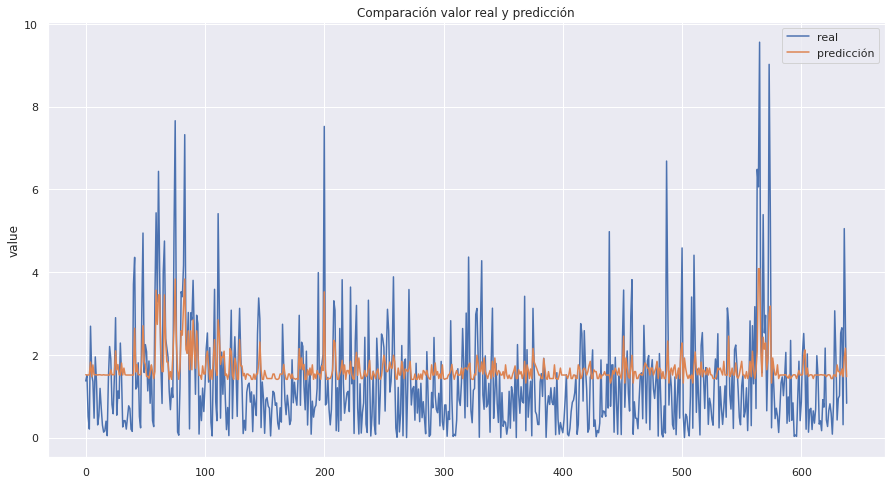

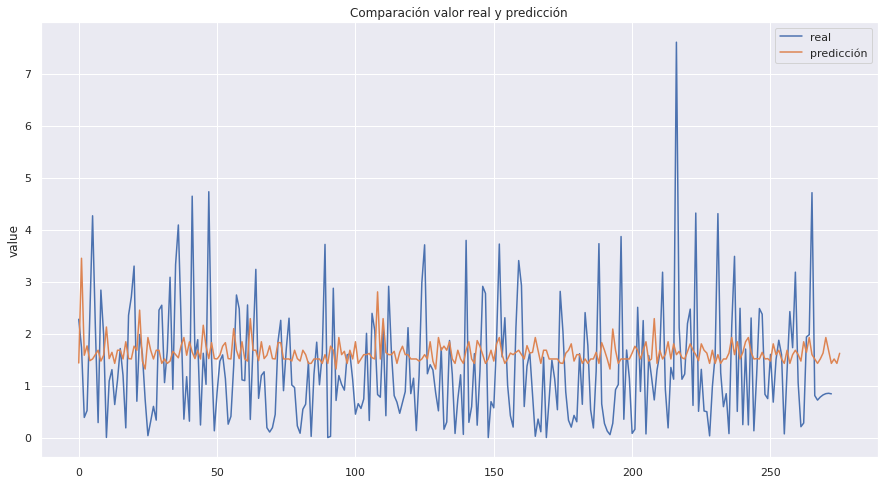

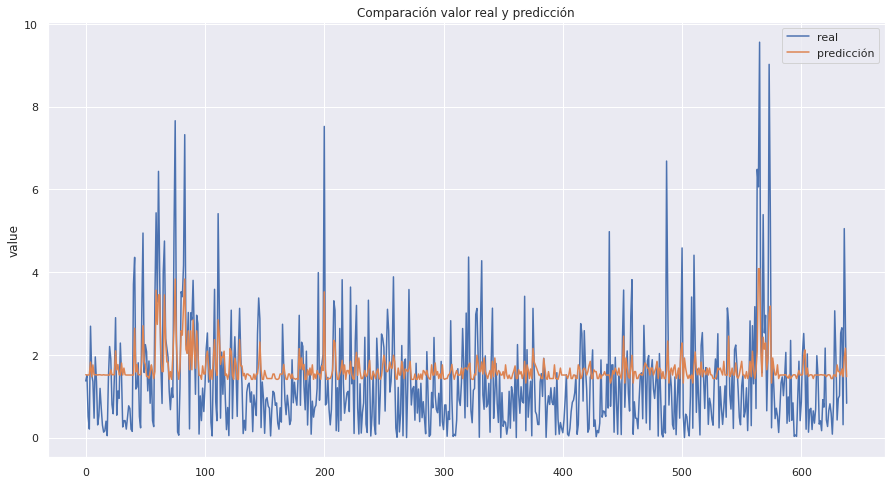

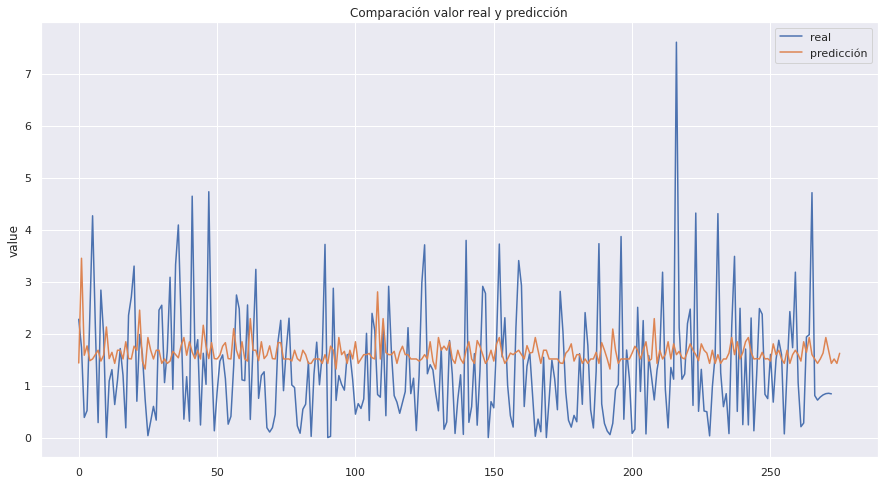

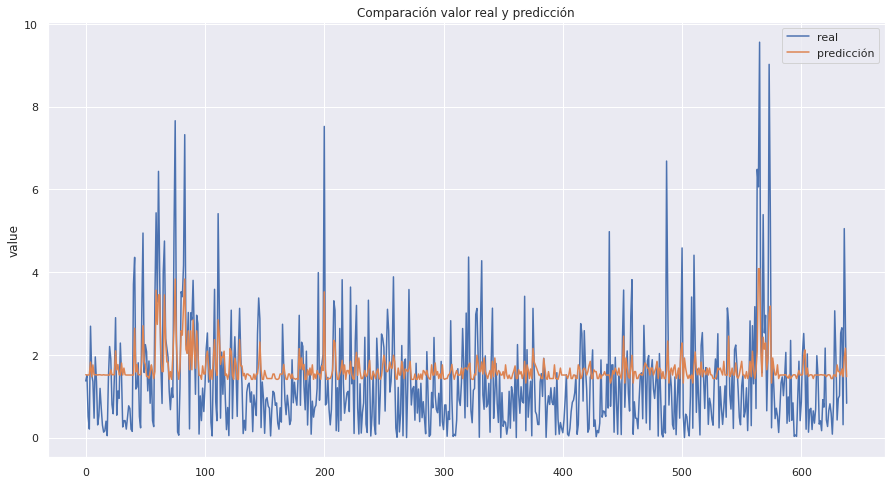

...

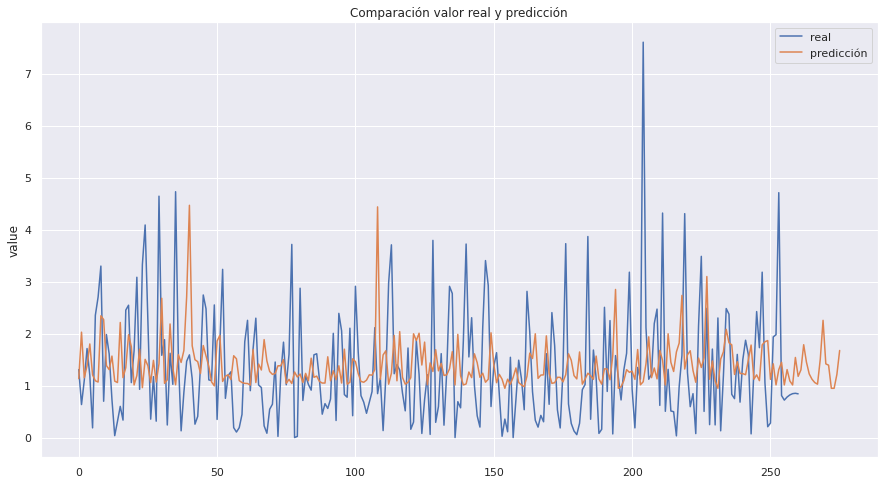

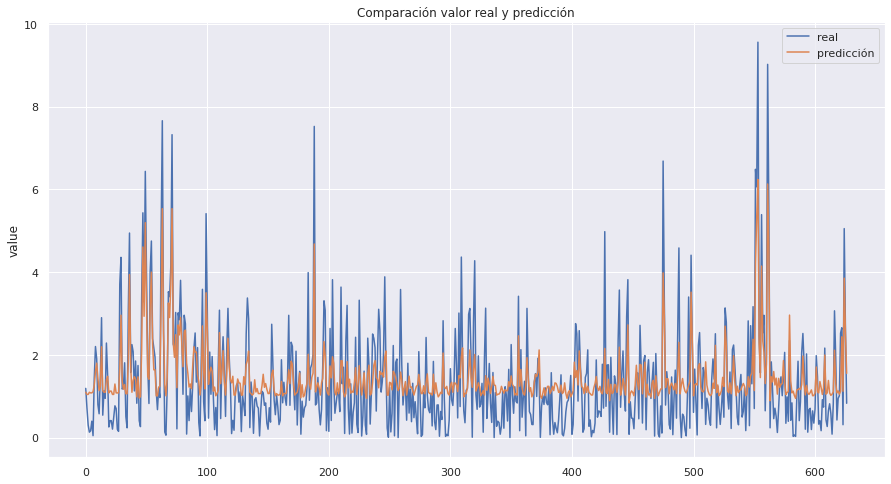

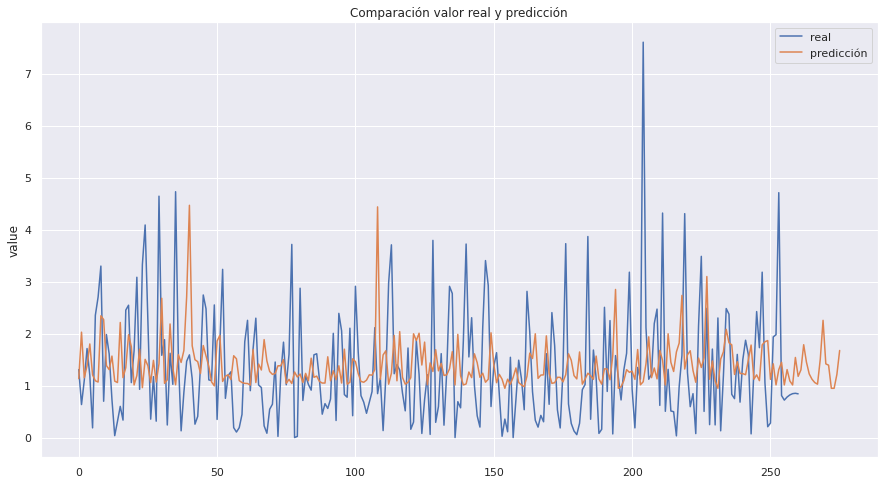

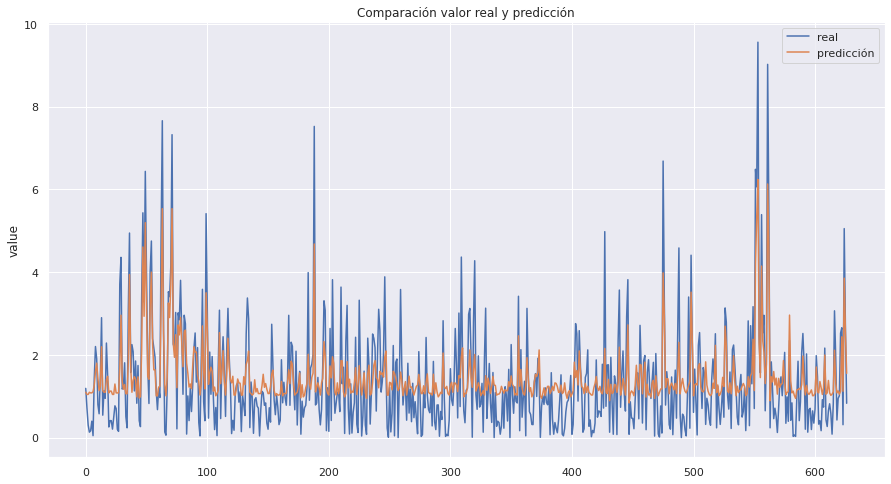

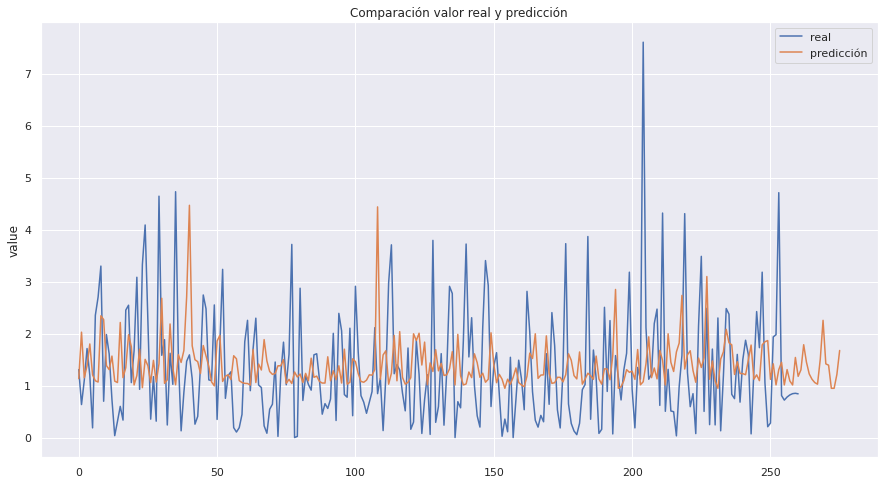

In [11]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)